# RetinaNet



In [ ]:
import torch
from torchvision.models.detection import retinanet_resnet50_fpn_v2, RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.io import read_image
from torchvision.transforms.functional import to_pil_image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
from glob import glob
import random


def load_model_praeprocesser():
    weights = RetinaNet_ResNet50_FPN_V2_Weights.DEFAULT
    model = retinanet_resnet50_fpn_v2(weights=weights)
    preprocesser = weights.transforms()
    categories = weights.meta["categories"]
    return model, categories, preprocesser

model, categories, preprocesser = load_model_preprocesser()

def prediction(img_path, categories, preprocesser, model, n=1):
    img = read_image(img_path)
    input_tensor = preprocesser(img)
    input_batch = input_tensor.unsqueeze(0)
    model.eval()
    with torch.no_grad():
        prediction = model(input_batch)[0]
    top_indices = prediction['scores'].topk(n).indices
    labels = [categories[prediction['labels'][i].item()] for i in top_indices]
    boxes = [prediction['boxes'][i].tolist() for i in top_indices]
    return input_tensor, labels, boxes



def detect_objects(input_tensor, labels, boxes):
    img = to_pil_image(input_tensor)
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    ax.axis('off')
    for box, label in zip(boxes, labels):
        rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        plt.text(box[0], box[1] - 20, label, color='red', fontsize=15, verticalalignment='top')
    plt.show()


def get_image_paths(root_dir, num_images=None):
    all_images = []
    for extension in ['*.jpg', '*.jpeg', '*.png']:
        all_images.extend(glob(os.path.join(root_dir, '**', extension), recursive=True))
    if num_images is None:
        return all_images
    else:
        return random.sample(all_images, min(num_images, len(all_images)))


directory_path = "/content/drive/MyDrive/datasets_and_files/multiple_objects"
image_paths = get_image_paths(directory_path)



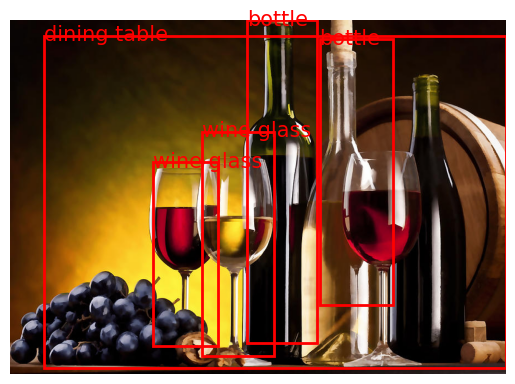

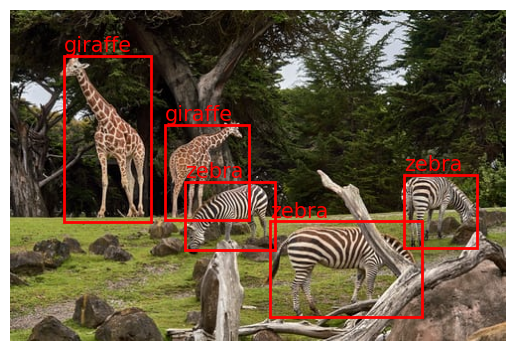

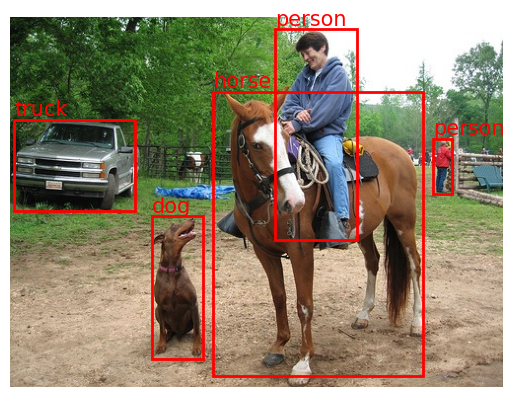

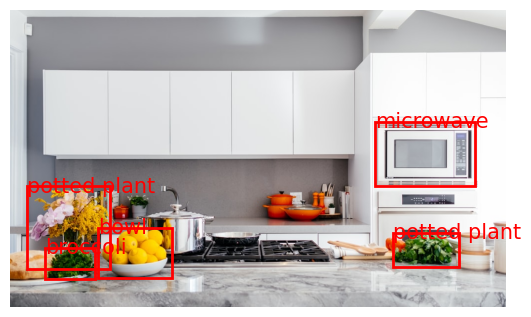

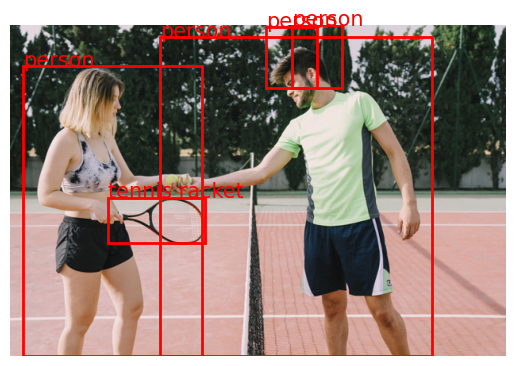

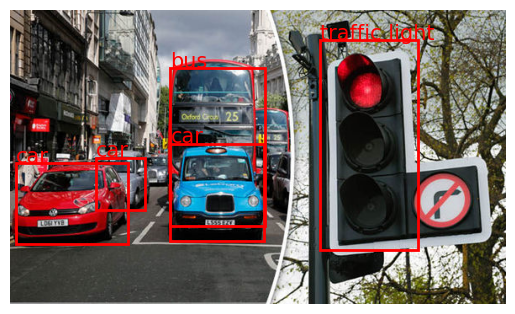

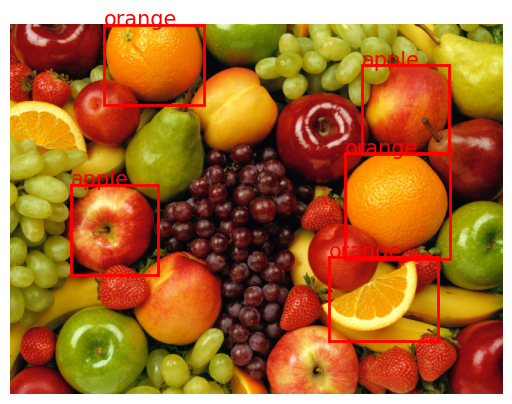

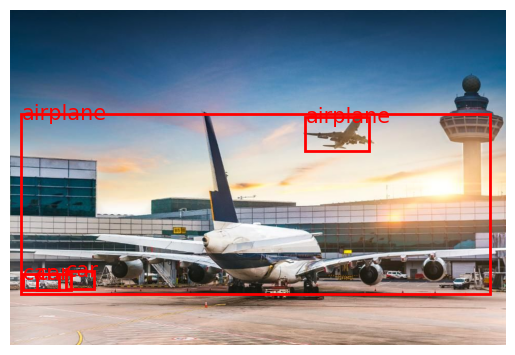

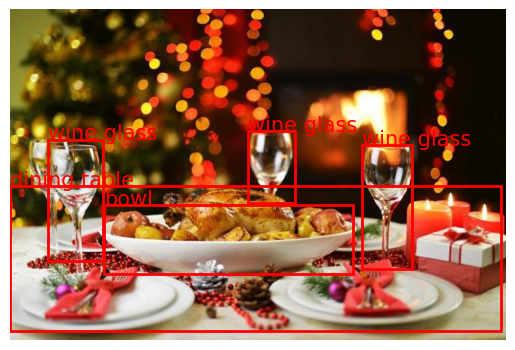

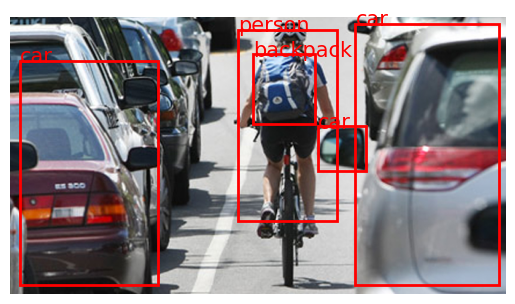

In [ ]:
for img_path in image_paths:
    input_tensor, labels, boxes = prediction(img_path, categories, preprocesser, model, 5)
    detect_objects(input_tensor, labels, boxes)


In [ ]:
img_path = "/content/drive/MyDrive/datasets_and_files/imagenet_samples/Eskimo_dog.jpeg"

In [ ]:
input_tensor, labels, boxes = prediction(img_path, categories, preprocesser, model, 1)

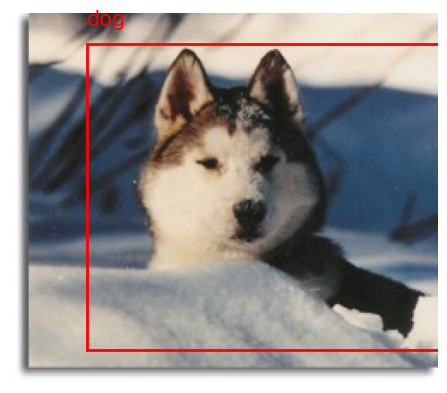

In [ ]:
detect_objects(input_tensor, labels, boxes)

# YOLO V8

In [ ]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 48.7 MB/s eta 0:00:00


In [ ]:
import random, os
from glob import glob
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import torch
print(torch.__version__)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
2.5.0+cu121


In [ ]:
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 145MB/s]


In [ ]:
def get_image_paths(root_dir, num_images=None):
    all_images = []
    for extension in ['*.jpg', '*.jpeg', '*.png']:
        all_images.extend(glob(os.path.join(root_dir, '**', extension), recursive=True))
    if num_images is None:
        return all_images
    else:
        return random.sample(all_images, min(num_images, len(all_images)))

In [ ]:
directory_path = "/content/drive/MyDrive/datasets_and_files/multiple_objects"

In [ ]:
image_paths = get_image_paths(directory_path)

In [ ]:
results = model(image_paths)


0: 640x640 3 bottles, 4 wine glasss, 192.8ms
1: 640x640 3 zebras, 2 giraffes, 192.8ms
2: 640x640 3 persons, 1 truck, 2 horses, 192.8ms
3: 640x640 1 cup, 5 bowls, 1 sandwich, 11 oranges, 3 potted plants, 1 microwave, 1 oven, 192.8ms
4: 640x640 2 persons, 2 tennis rackets, 192.8ms
5: 640x640 1 person, 6 cars, 2 buss, 1 truck, 2 traffic lights, 192.8ms
6: 640x640 13 apples, 5 oranges, 192.8ms
7: 640x640 2 airplanes, 2 trucks, 192.8ms
8: 640x640 1 traffic light, 4 wine glasss, 2 cups, 1 bowl, 2 dining tables, 192.8ms
9: 640x640 1 person, 2 bicycles, 7 cars, 1 backpack, 192.8ms
Speed: 4.9ms preprocess, 192.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


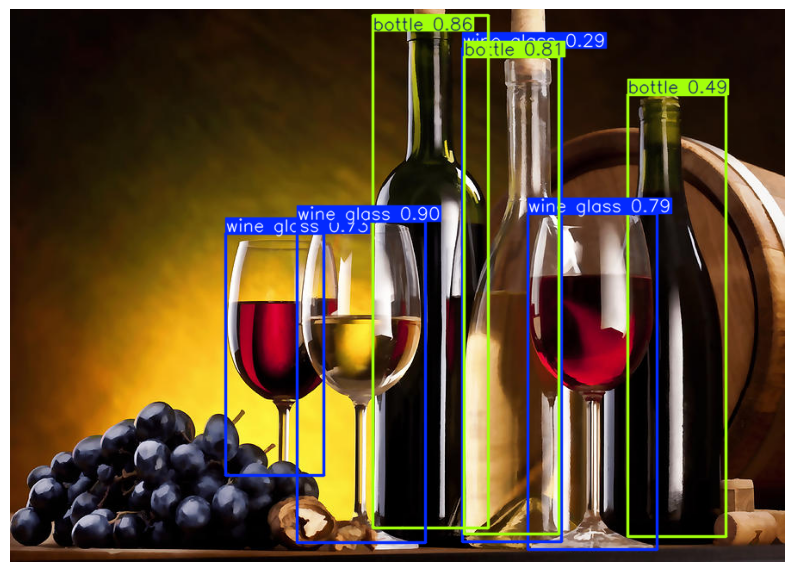

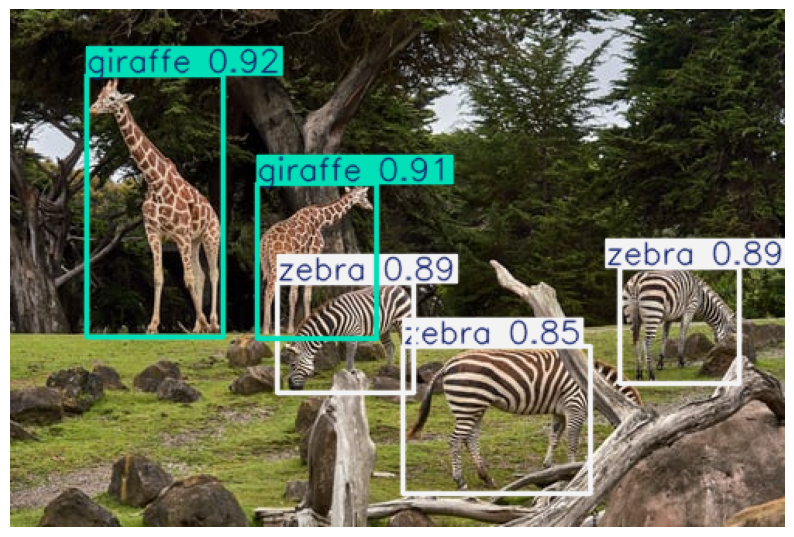

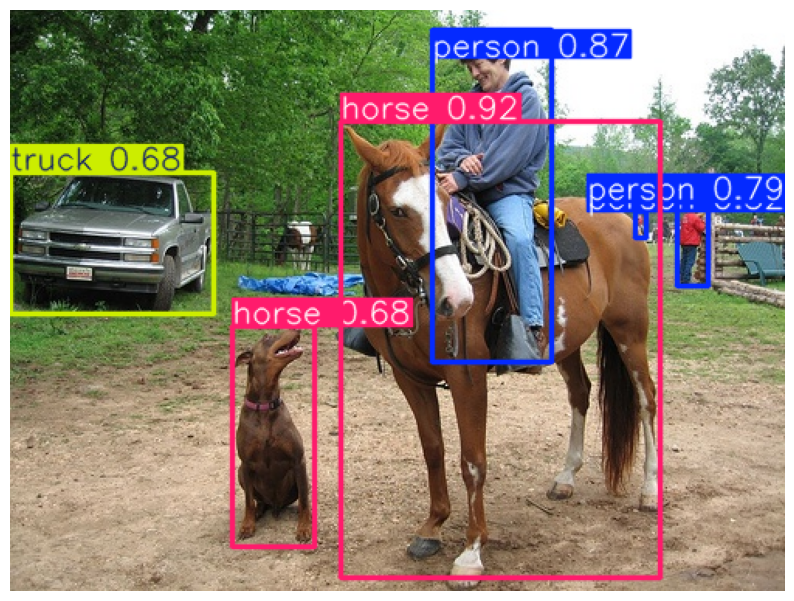

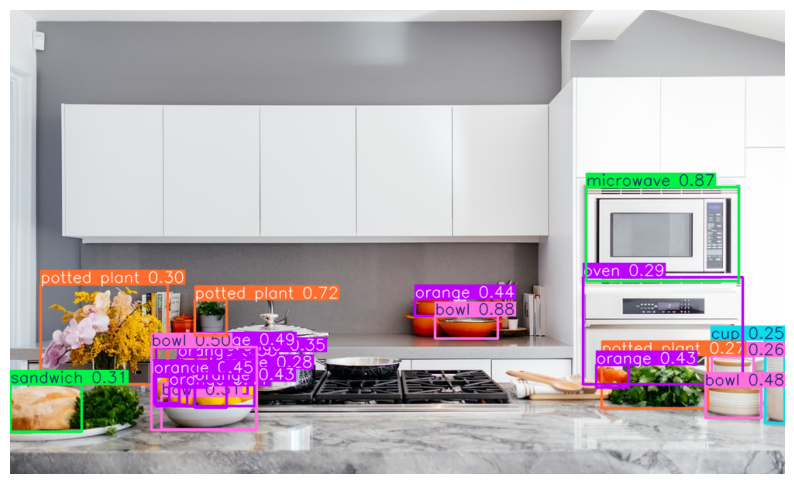

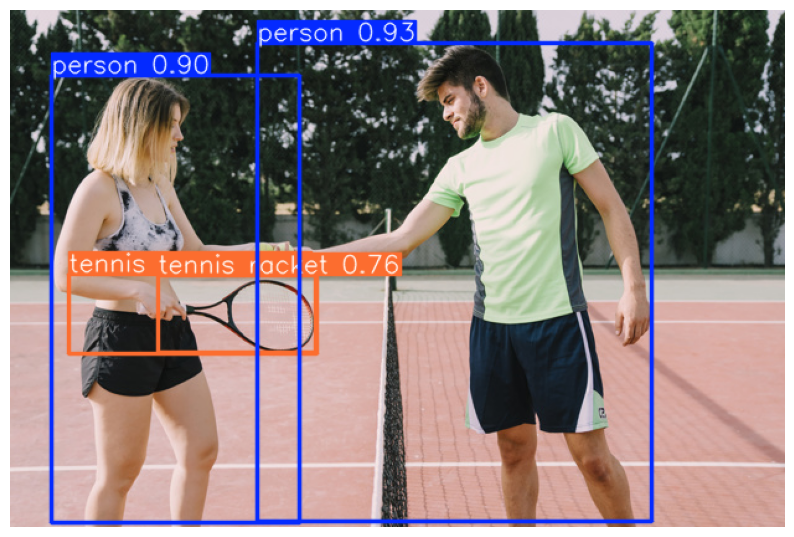

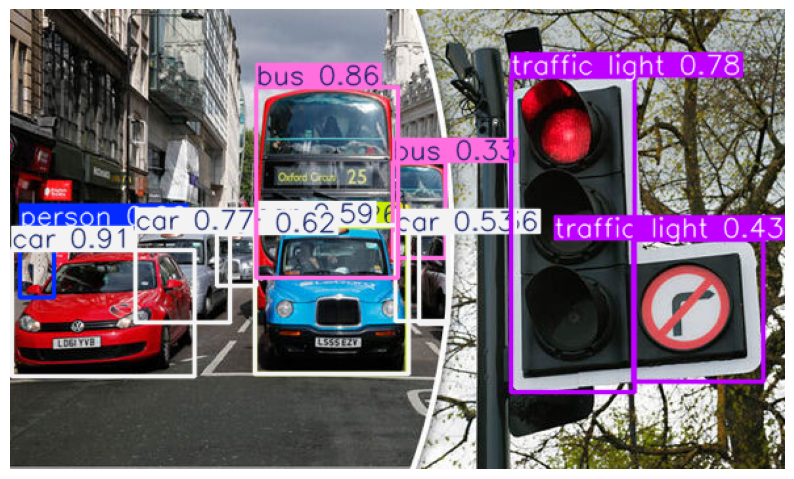

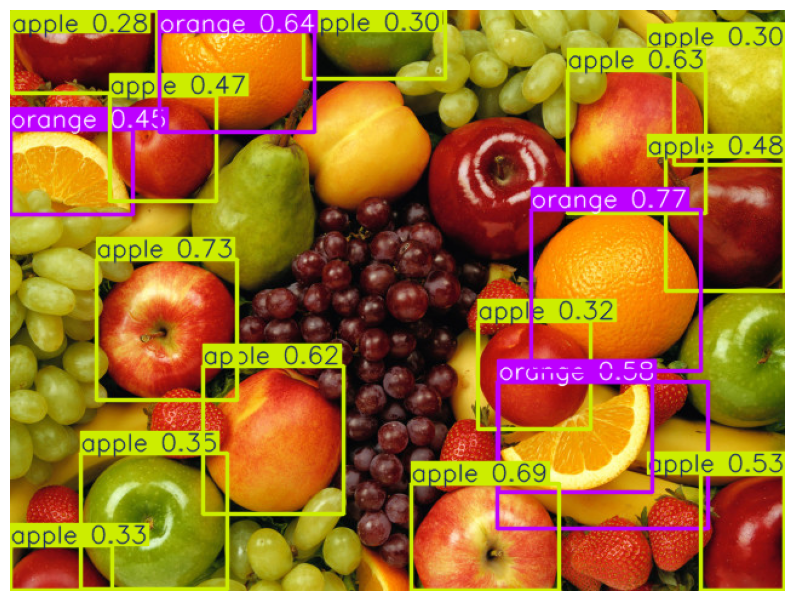

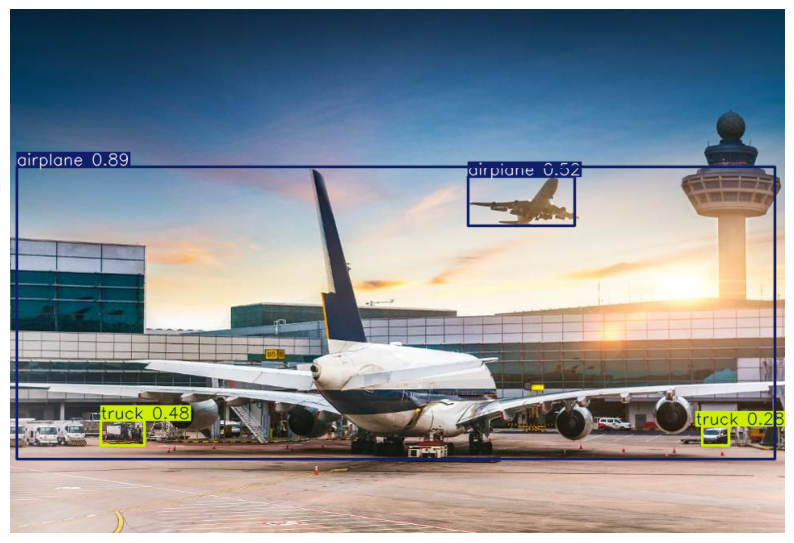

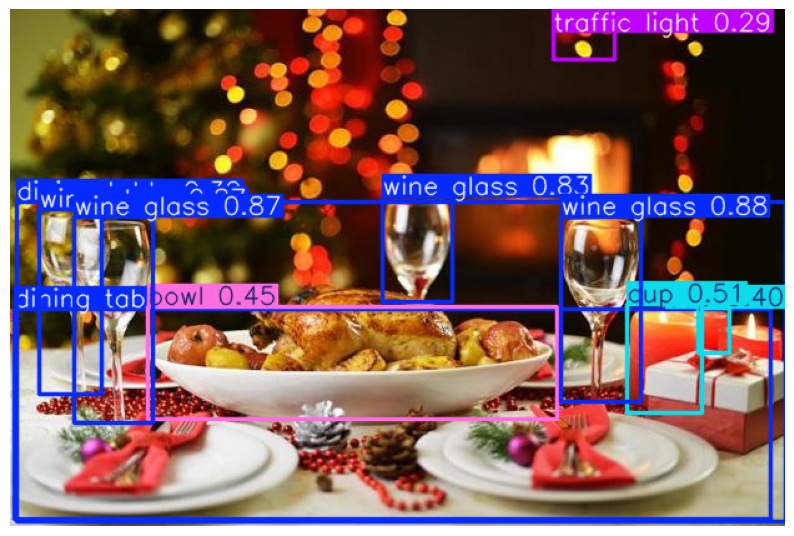

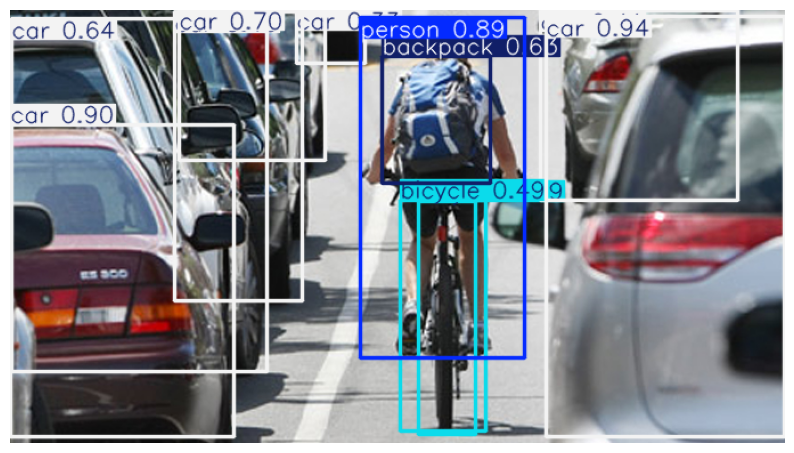

In [ ]:
for i, r in enumerate(results):

    im_bgr = r.plot()
    im_rgb = Image.fromarray(im_bgr[..., ::-1])

    plt.figure(figsize=(10, 10))
    plt.imshow(im_rgb)
    plt.axis('off')
    plt.show()

# YOLOv3 with Open CV

## Imports

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
import random, os
import numpy as np
from glob import glob

## Config Files and Class Names

In [ ]:
config = "/content/drive/MyDrive/datasets_and_files/yolo_files/yolov3.cfg"

weights = "/content/drive/MyDrive/datasets_and_files/yolo_files/yolov3.weights"

labels_path = "/content/drive/MyDrive/datasets_and_files/yolo_files/coco.names"

with open(labels_path, 'r') as f:
    classes = f.read().strip().split('\n')

## Load Model

In [ ]:
def load_yolo_model(config_path, weights_path):

    net = cv2.dnn.readNetFromDarknet(config_path, weights_path)

    layer_names = net.getLayerNames()

    output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers().flatten()]

    return net, output_layers

In [ ]:
net, output_layers = load_yolo_model(config, weights)

## Detect Objects

In [ ]:
def detect_objects(net, image, output_layers):

    height, width, _ = image.shape
    blob = cv2.dnn.blobFromImage(image, 0.00392, (416, 416), (0, 0, 0), True, crop=False) #preprocessing
    net.setInput(blob)
    outs = net.forward(output_layers)


    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]

            class_id = np.argmax(scores)

            confidence = scores[class_id]

            if confidence > 0.5:

                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)

                w = int(detection[2] * width)

                h = int(detection[3] * height)

                x = int(center_x - w / 2)

                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])

                confidences.append(float(confidence))

                class_ids.append(class_id)

    return boxes, confidences, class_ids


In [ ]:
image = cv2.imread("/content/drive/MyDrive/datasets_and_files/multiple_objects/airport.jpg")

In [ ]:
boxes, confidences, class_ids = detect_objects(net, image, output_layers)

## Visualize Prediction

In [ ]:
def draw_labels(boxes, confidences, class_ids, classes, image):
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    font = cv2.FONT_HERSHEY_PLAIN
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            confidence = confidences[i]
            color = (0, 255, 0)
            cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
            cv2.putText(image, f"{label} {round(confidence, 2)}", (x, y + 30), font, 2, color, 2)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()

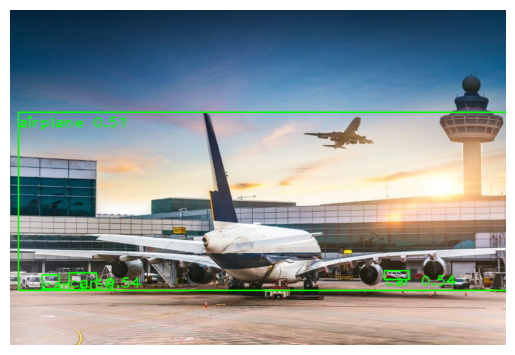

In [ ]:
draw_labels(boxes, confidences, class_ids, classes, image)

In [ ]:
def get_image_paths(root_dir, num_images=None):
    all_images = []
    for extension in ['*.jpg', '*.jpeg', '*.png']:
        all_images.extend(glob(os.path.join(root_dir, '**', extension), recursive=True))
    if num_images is None:
        return all_images
    else:
        return random.sample(all_images, min(num_images, len(all_images)))

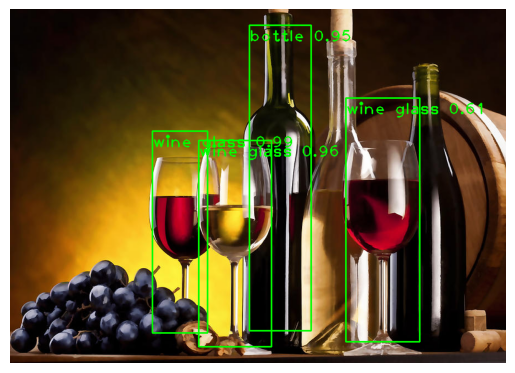

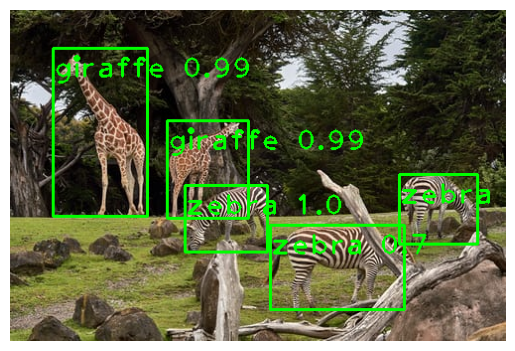

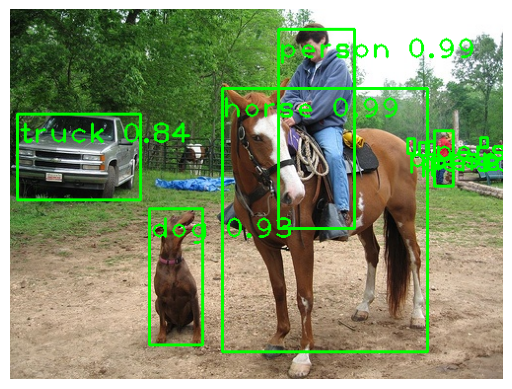

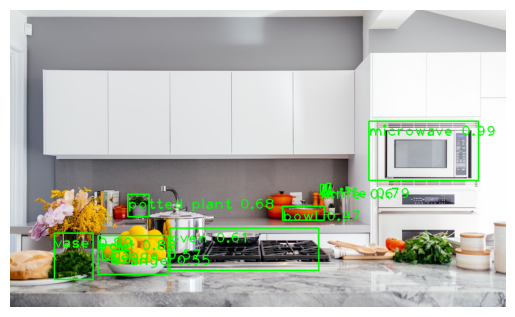

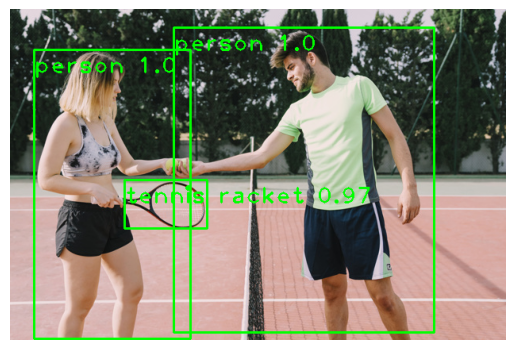

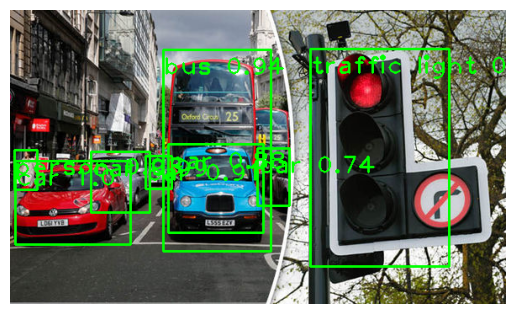

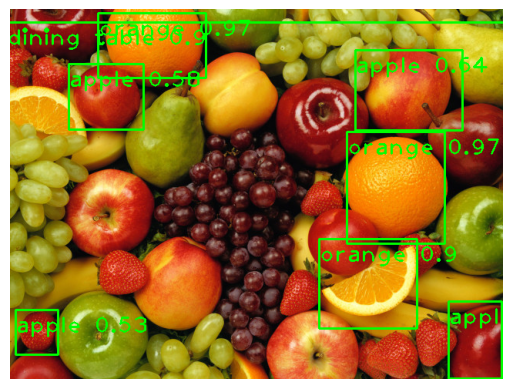

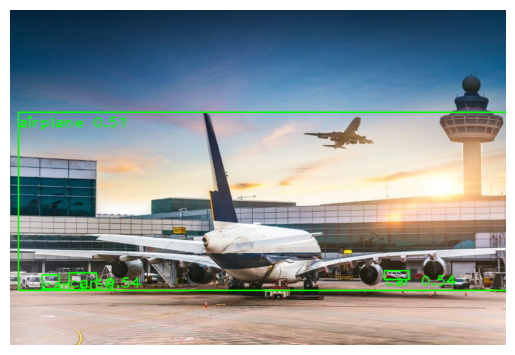

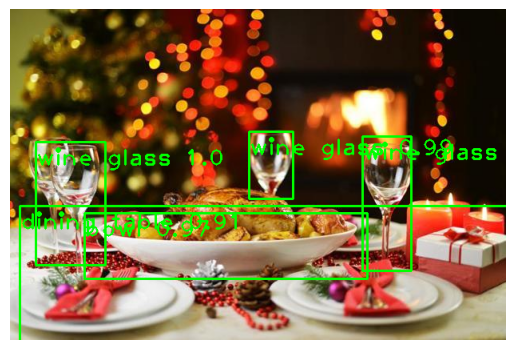

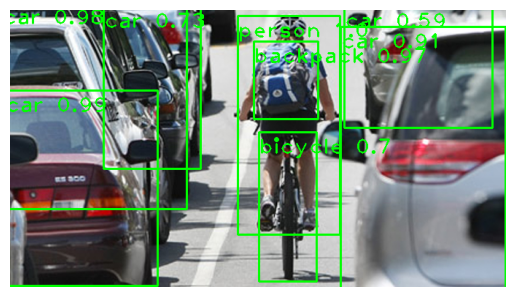

In [ ]:
directory_path = "/content/drive/MyDrive/datasets_and_files/multiple_objects"
image_paths = get_image_paths(directory_path)

for img_path in image_paths:
    image = cv2.imread(img_path)
    boxes, confidences, class_ids = detect_objects(net, image, output_layers)
    draw_labels(boxes, confidences, class_ids, classes, image)

In [ ]:
image = cv2.imread("/content/drive/MyDrive/datasets_and_files/imagenet_samples/Eskimo_dog.jpeg")

In [ ]:
boxes, confidences, class_ids = detect_objects(net, image, output_layers)

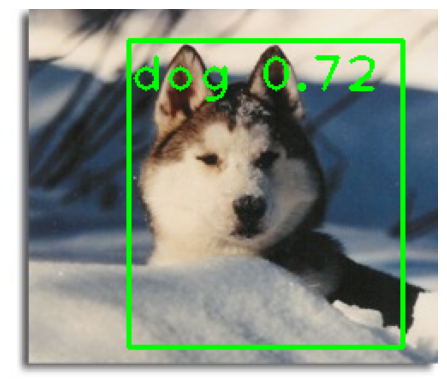

In [ ]:
draw_labels(boxes, confidences, class_ids, classes, image)